# Plotly maps, animations, 3D

**Note**: the animated plots we'll make today can be a bit "memory-hungry", which can become a problem when saving a notebook. If you are having trouble, re-download the notebook and clear the output, then re-run things.

In [1]:
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd
import numpy as np
import json
from netCDF4 import Dataset as netcdf_dataset

# Plotly Choropleth Maps

`plotly` is a fun mapping package that can be used to make interactive maps, where you can hover or zoom out for example. We learned last time how to make choropleth maps in `cartopy`. Here we will use `plotly`, which is similar in spirit but better for web-type applications that require user interaction. In this example will look at temperature data for states and countries.

- Modified from https://www.kaggle.com/amelinvladislav/map-of-temperatures-and-analysis-of-global-warming/notebook

- Data from https://www.kaggle.com/berkeleyearth/climate-change-earth-surface-temperature-data

### Load the data and clean it

In [2]:
## Temperature data by state

# Read data, parse dates
df_state = pd.read_csv('lecture21_globaltemps_states.csv',parse_dates=['dt'])

# Make a month column
df_state['Month'] = df_state['dt'].dt.month

# Only keep the US States
df_state = df_state[df_state['Country'] == 'United States']

# Fix Georgia
df_state = df_state.replace('Georgia (State)', 'Georgia') 

# Drop NaNs
df_state = df_state.dropna()
df_state.head()

,dt,AverageTemperature,AverageTemperatureUncertainty,State,Country,Month
7458,1743-11-01,10.722,2.898,Alabama,United States,11
7463,1744-04-01,19.075,2.902,Alabama,United States,4
7464,1744-05-01,21.197,2.844,Alabama,United States,5
7465,1744-06-01,25.290,2.879,Alabama,United States,6
7466,1744-07-01,26.420,2.841,Alabama,United States,7


In [3]:
## Temperature data by country

# Read data, parse dates
df_country = pd.read_csv('lecture21_globaltemps_countries.csv',parse_dates=['dt'])

# Drop NaNs
df_country = df_country.dropna()

# Make a month column
df_country['Month'] = df_country['dt'].dt.month

# Fix some country names
df_country = df_country.replace(
   ['Denmark (Europe)', 'France (Europe)', 'Netherlands (Europe)', 'United Kingdom (Europe)'],
   ['Denmark', 'France', 'Netherlands', 'United Kingdom']) 
df_country.head()

,dt,AverageTemperature,AverageTemperatureUncertainty,Country,Month
0,1743-11-01,4.384,2.294,Åland,11
5,1744-04-01,1.530,4.680,Åland,4
6,1744-05-01,6.702,1.789,Åland,5
7,1744-06-01,11.609,1.577,Åland,6
8,1744-07-01,15.342,1.410,Åland,7


### Calculate average temperature for each state for month of January

In [4]:
# Logical indices: only data in January
ixJ = df_state['Month']==1 

# Use groupby to calculate average mean temperature in January by state
df_state_avg = df_state.loc[ixJ,["State", "AverageTemperature"]].groupby("State", sort=True).mean()

# Remove state from index so it is an actual column
df_state_avg.reset_index(inplace=True)

# Rename columns for convenience/clarity
df_state_avg.rename(columns={"AverageTemperature": "Temp_Jan"},inplace=True)

# Convert from Celsius to Fahrenheit
df_state_avg["Temp_Jan"] = 9.0/5.0 * df_state_avg["Temp_Jan"] + 32.0

# Show header
df_state_avg.head()

,State,Temp_Jan
0,Alabama,44.841638
1,Alaska,-3.838540
2,Arizona,40.435253
3,Arkansas,39.175718
4,California,42.507942


#### Add state abbreviations

In [5]:
# Load the state abbreviation file
df_state_abbr = pd.read_csv('lecture21_states_abbr.csv')
df_state_abbr.head()

,State,Abbreviation
0,Alabama,AL
1,Alaska,AK
2,Arizona,AZ
3,Arkansas,AR
4,California,CA


In [6]:
# Merge with data
df_state_avg = pd.merge(left=df_state_avg, right=df_state_abbr, on="State", how="left")
df_state_avg.head()

,State,Temp_Jan,Abbreviation
0,Alabama,44.841638,AL
1,Alaska,-3.838540,AK
2,Arizona,40.435253,AZ
3,Arkansas,39.175718,AR
4,California,42.507942,CA


### Make a state choropleth map using `plotly` 

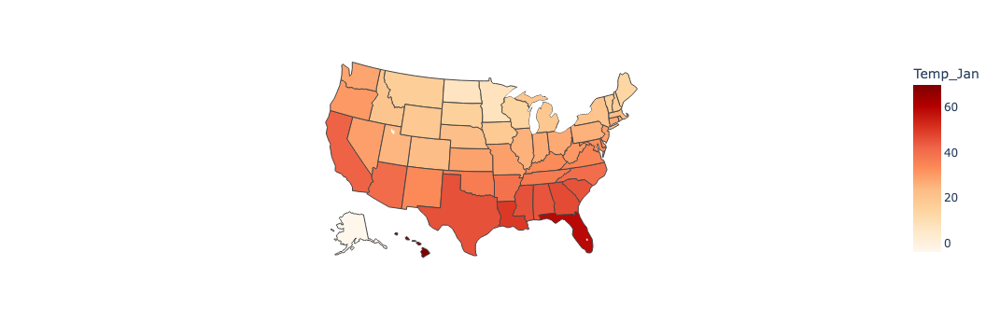

In [7]:
fig = px.choropleth(df_state_avg,
                    locations="Abbreviation",
                    locationmode = 'USA-states',
                    color="Temp_Jan", 
                    hover_name="State", 
                    scope='usa',
                    color_continuous_scale=px.colors.colorbrewer.OrRd)
fig.show()

### There are many different color scales
https://plotly.com/python/builtin-colorscales/

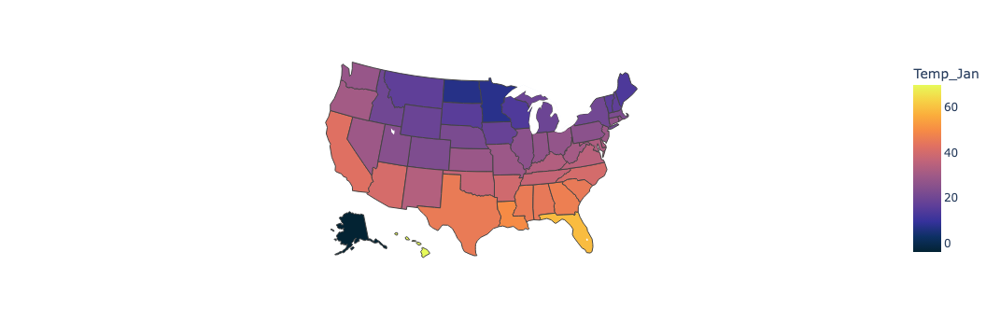

In [8]:
fig = px.choropleth(df_state_avg,
                    locations="Abbreviation",
                    locationmode = 'USA-states',
                    color="Temp_Jan", 
                    hover_name="State", 
                    scope='usa',
                    color_continuous_scale=px.colors.sequential.thermal)
fig.show()

### Global choropleth maps with `plotly`

In [9]:
# Logical indices: only data in July
ixJ = df_country['Month']==7 

# Use groupby to calculate average mean temperature in July by country
df_country_avg = df_country.loc[ixJ,["Country","AverageTemperature"]].groupby("Country", sort=True).mean()

# Remove state from index so it is an actual column
df_country_avg.reset_index(inplace=True)

# Rename columns for convenience/clarity
df_country_avg.rename(columns={"AverageTemperature": "Temp_July"},inplace=True)

# Convert from Celsius to Fahrenheit
df_country_avg["Temp_July"] = 9.0/5.0 * df_country_avg["Temp_July"] + 32.0

# Show header
df_country_avg.head()

,Country,Temp_July
0,Afghanistan,80.479338
1,Africa,77.380222
2,Albania,72.392416
3,Algeria,92.592850
4,American Samoa,79.180091


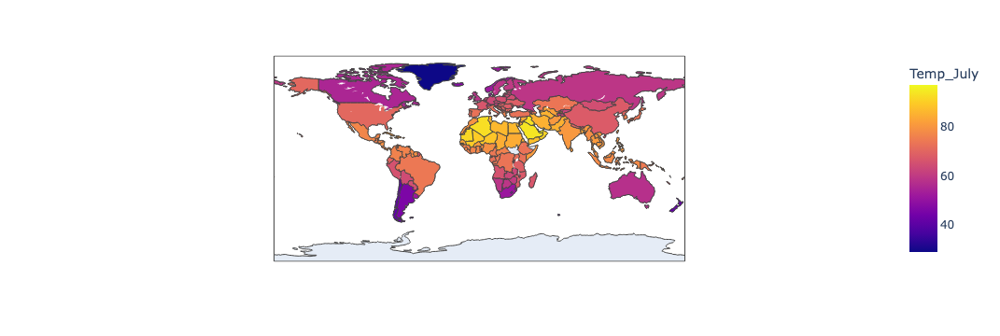

In [10]:
fig = px.choropleth(df_country_avg,
                    locations="Country",
                    locationmode = 'country names',
                    color="Temp_July", 
                    hover_name="Country", 
                    color_continuous_scale=px.colors.sequential.Plasma)
fig.show()

### Output file to .html 

You can then open this in any browser without a Jupyter setup...

In [11]:
fig.write_html('lecture21_globaltemps.html')

### Using `plotly` to plot data on maps

Just like in `cartopy`, we can use `plotly` to plot data points on regional or global maps. Again, the main differences are in the display and the command syntax.

#### Load earthquake data, clean, add year column

In [12]:
# file read
df_eq = pd.read_csv("lecture20_eq.csv")

# compute and sort by date
df_eq["Date"] = pd.to_datetime(df_eq["Date"], utc=True, format="mixed")
df_eq["Year"] = df_eq['Date'].dt.year
df_eq.sort_values(by="Date", inplace=True)

# subset
df_eq = df_eq[df_eq['Type'] == 'Earthquake']
df_eq = df_eq[df_eq['Depth'] > 0]
df_eq = df_eq[df_eq.Year >= 2010]

# reset index
df_eq.reset_index(drop=True,inplace=True)

# show
df_eq

,Date,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Type,...,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status,Year
0,2010-01-02 00:00:00+00:00,08:45:33,12.4240,141.9490,Earthquake,8.00,NaN,234.0,6.1,MWB,...,30.10,NaN,NaN,1.1500,USP000H5M6,US,US,US,Reviewed,2010
1,2010-01-03 00:00:00+00:00,04:11:39,-5.2970,145.8590,Earthquake,34.00,NaN,193.0,5.8,MWC,...,16.00,NaN,NaN,0.9700,USP000H5MT,US,US,US,Reviewed,2010
2,2010-01-03 00:00:00+00:00,20:39:13,-8.8020,-77.7180,Earthquake,116.80,NaN,386.0,5.7,MWB,...,42.40,NaN,NaN,1.2000,USP000H5NA,US,US,US,Reviewed,2010
3,2010-01-03 00:00:00+00:00,21:48:03,-8.7260,157.4870,Earthquake,10.00,NaN,282.0,6.6,MWC,...,16.60,NaN,NaN,1.2400,USP000H5ND,US,US,US,Reviewed,2010
4,2010-01-03 00:00:00+00:00,22:36:26,-8.7830,157.3540,Earthquake,10.00,NaN,377.0,7.1,MWC,...,15.00,NaN,NaN,1.0900,USP000H5NP,US,US,GCMT,Reviewed,2010
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3567,2016-12-28 00:00:00+00:00,08:18:01,38.3754,-118.8977,Earthquake,10.80,1.3,34.0,5.6,ML,...,35.86,0.132,NaN,0.1988,NN00570709,NN,NN,NN,Reviewed,2016
3568,2016-12-28 00:00:00+00:00,08:22:12,38.3917,-118.8941,Earthquake,12.30,1.2,40.0,5.6,ML,...,42.47,0.120,NaN,0.1898,NN00570710,NN,NN,NN,Reviewed,2016
3569,2016-12-28 00:00:00+00:00,12:38:51,36.9179,140.4262,Earthquake,10.00,1.8,NaN,5.9,MWW,...,91.00,0.992,4.8,1.5200,US10007NAF,US,US,US,Reviewed,2016
3570,2016-12-29 00:00:00+00:00,22:30:19,-9.0283,118.6639,Earthquake,79.00,1.8,NaN,6.3,MWW,...,26.00,3.553,6.0,1.4300,US10007NL0,US,US,US,Reviewed,2016


#### Make a map with earthquake symbol scaled by depth

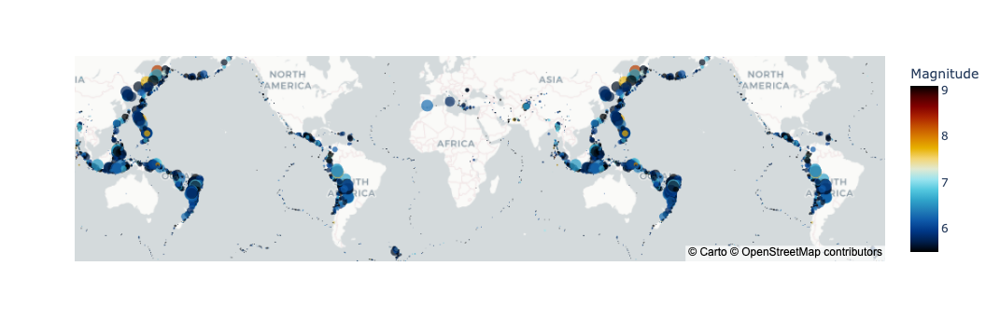

In [13]:
### Deeper earthquakes are larger, bigger earthquakes are redder

# make map and show
fig = px.scatter_mapbox(df_eq, lat="Latitude", lon="Longitude", 
                size="Depth", color="Magnitude",
                color_continuous_scale=px.colors.cyclical.IceFire, size_max=10,
                zoom=0, mapbox_style="carto-positron")
fig.show()

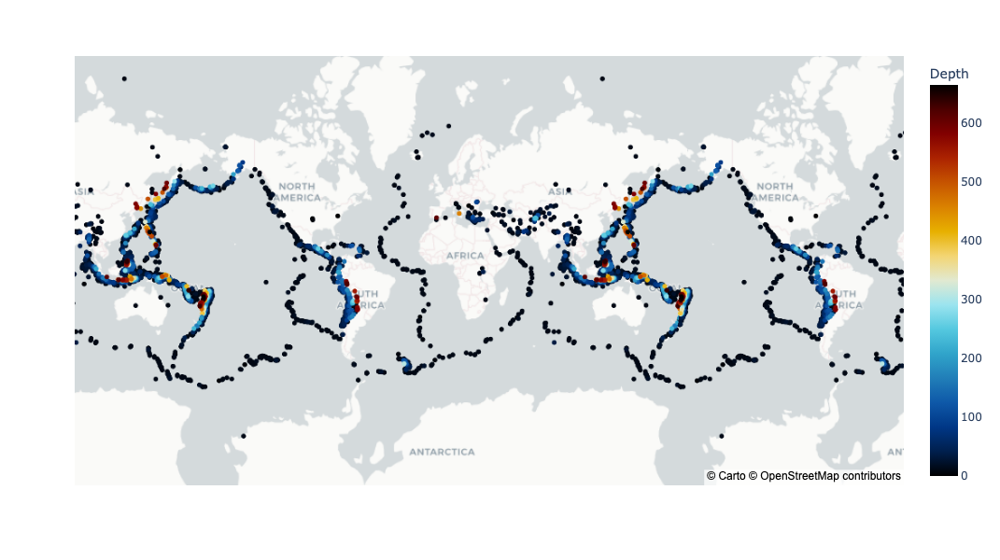

In [14]:
### This makes it easier to see depth trends
df_eq.sort_values(by="Depth",inplace=True)

# make map and show
fig = px.scatter_mapbox(df_eq, lat="Latitude", lon="Longitude", color="Depth",
                color_continuous_scale=px.colors.cyclical.IceFire, size_max=10,
                zoom=0, mapbox_style="carto-positron")


# here's how to change the figure size
fig.update_layout(autosize=False,width=800, height=600) # use this to change size

fig.show()

#### Reminder: You can output figure to html file with `.write_html()`

In [15]:
fig.write_html('lecture21_earthquakes.html')

### Animated Map

This plots a sequence of panels, e.g. temporal evolution.

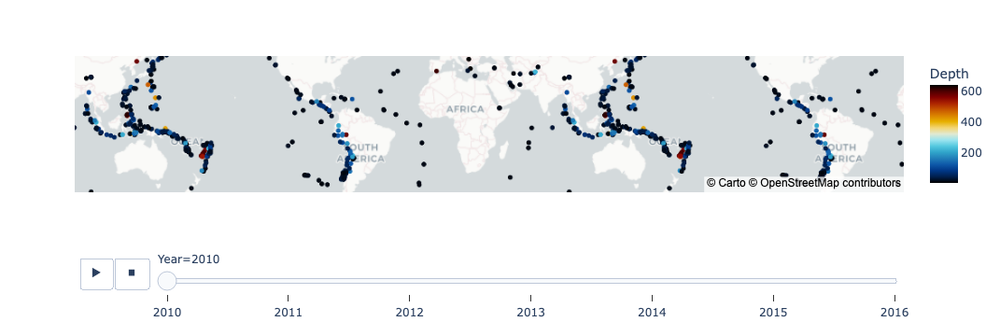

In [16]:
# Need to sort in temporal order first
df_eq.sort_values(by="Date",inplace=True)
df_eq.reset_index(drop=True)

# We'll use df_eq with all the earthquakes
fig = px.scatter_mapbox(df_eq, lat="Latitude", lon="Longitude", animation_frame="Year",
                        color_continuous_scale=px.colors.cyclical.IceFire,
                        color="Depth", zoom=0, mapbox_style="carto-positron")

fig.show()

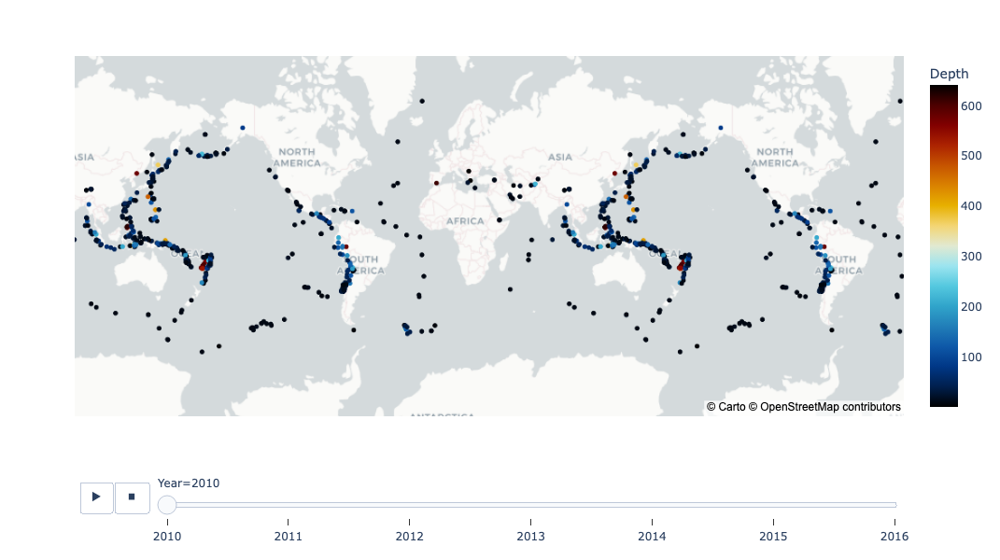

In [17]:
# Need to sort in temporal order first
df_eq.sort_values(by="Date",inplace=True)
df_eq.reset_index(drop=True)

# We'll use df_eq with all the earthquakes
fig = px.scatter_mapbox(df_eq, lat="Latitude", lon="Longitude", animation_frame="Year",
                        color_continuous_scale = px.colors.cyclical.IceFire,
                        color="Depth", zoom=0, mapbox_style="carto-positron")


# here's how to adjust the frame speed
fig.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 1500 # 1 sec = 1500 ms

# here's how to change the figure size
fig.update_layout(autosize=False,width=800, height=600) # use this to change size


# show
fig.show()


### Animated Choropleth Maps

#### Animated state choropleth map: animate by month

In [18]:
### Get average temperature in each month

# we already loaded df_state
display(df_state)

# calculate in one line using groupby
df_state_mo = df_state[["State","Month","AverageTemperature"]].groupby(["State", "Month"], as_index=False).mean()

# add in state abbreviations
df_state_mo = pd.merge(left=df_state_mo, right=df_state_abbr, on="State", how="left")

# convert from Celsius
df_state_mo["AverageTemperature"] = 32.0 + 9/5 * df_state_mo["AverageTemperature"]

# show results
df_state_mo

,dt,AverageTemperature,AverageTemperatureUncertainty,State,Country,Month
7458,1743-11-01,10.722,2.898,Alabama,United States,11
7463,1744-04-01,19.075,2.902,Alabama,United States,4
7464,1744-05-01,21.197,2.844,Alabama,United States,5
7465,1744-06-01,25.290,2.879,Alabama,United States,6
7466,1744-07-01,26.420,2.841,Alabama,United States,7
...,...,...,...,...,...,...
626435,2013-05-01,10.607,0.208,Wyoming,United States,5
626436,2013-06-01,16.267,0.276,Wyoming,United States,6
626437,2013-07-01,20.222,0.133,Wyoming,United States,7
626438,2013-08-01,19.621,0.217,Wyoming,United States,8


,State,Month,AverageTemperature,Abbreviation
0,Alabama,1,44.841638,AL
1,Alabama,2,48.185916,AL
2,Alabama,3,54.826377,AL
3,Alabama,4,62.739202,AL
4,Alabama,5,70.655070,AL
...,...,...,...,...
607,Wyoming,8,63.817583,WY
608,Wyoming,9,53.939546,WY
609,Wyoming,10,41.954099,WY
610,Wyoming,11,29.716502,WY


In [19]:
# What are minimum and maximum temperatures?
df_state_mo.describe()

,Month,AverageTemperature
count,612.000000,612.000000
mean,6.500000,51.328480
std,3.454876,18.239290
min,1.000000,-3.838540
25%,3.750000,37.401654
50%,6.500000,52.992945
75%,9.250000,66.634050
max,12.000000,82.230178


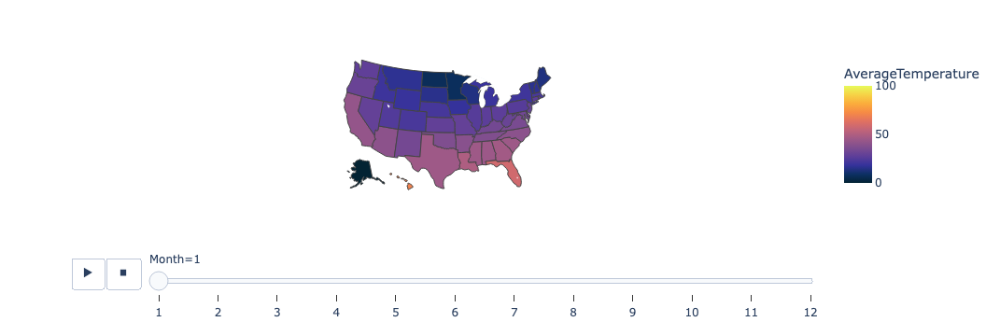

In [20]:
### Choropleth map: by month!
fig = px.choropleth(df_state_mo,
                    locations="Abbreviation",
                    locationmode='USA-states',
                    color="AverageTemperature", 
                    hover_name="State", 
                    scope='usa',
                    animation_frame="Month",
                    color_continuous_scale=px.colors.sequential.thermal,
                    #color_continuous_scale=px.colors.sequential.thermal[::-1], # flip cb
                    range_color=(0, 100))
fig.show()

### 3D Surface Maps

##### Available colorscales:

* Greys
* YlGnBu
* Greens
* YlOrRd
* Bluered
* RdBu
* Reds
* Blues
* Picnic
* Rainbow
* Portland
* Jet
* Hot
* Blackbody
* Earth
* Electric
* Viridis
* Cividis

In [21]:
### Load familar gravity grid

# import netcdf
grav_grid=netcdf_dataset('lecture13_grav.grd')

# extract arrays
x_range = np.asarray(grav_grid.variables['x_range'])
y_range = np.asarray(grav_grid.variables['y_range'])
dimension = np.asarray(grav_grid.variables['dimension'])
nx = dimension[0]
ny = dimension[1]

# convert to plotting grid
xgrav = np.linspace(x_range[0], x_range[1], nx)
ygrav = np.linspace(y_range[1], y_range[0], ny)
zgrav = np.asarray(grav_grid.variables['z'])
zgrav = zgrav.reshape(ny, nx)

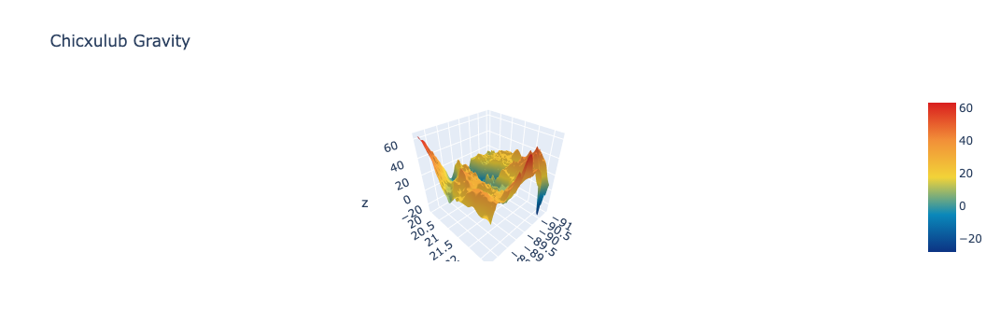

In [22]:
### Make a Graphical Object Surface Plot, go.Surface

# plotting data
fig = go.Figure(data=[go.Surface(z=zgrav, x=xgrav, y=ygrav, colorscale='Portland')])

# Add title
fig.update_layout(title='Chicxulub Gravity',)

fig.show()

In [23]:
### Write to file
fig.write_html('chicx_grav.html')

#### 3D Surface Map with Contours

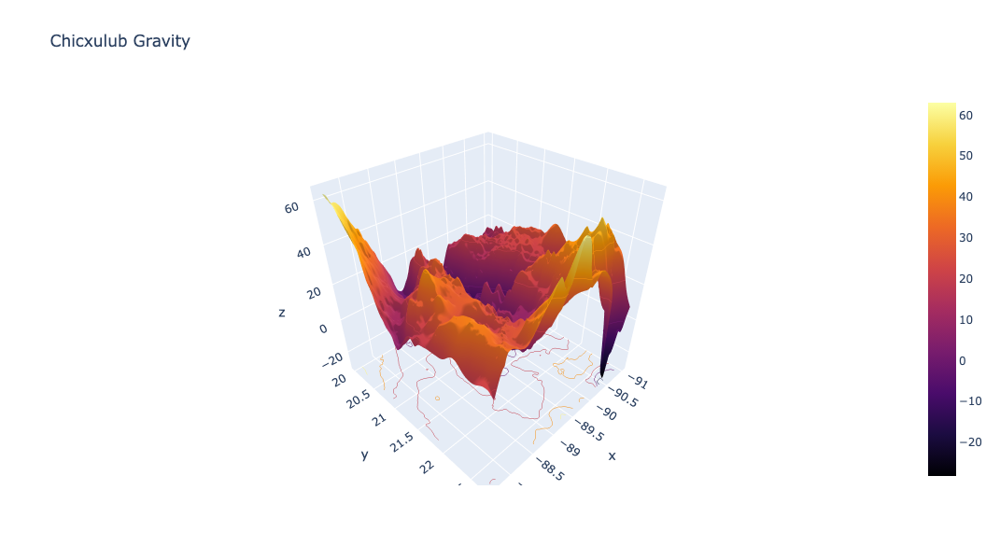

In [24]:
# make figure
fig = go.Figure(data=[go.Surface(z=zgrav, x=xgrav, y=ygrav, colorscale='Inferno')])

# add contours
fig.update_traces(contours_z=dict(show=True, usecolormap=True,project_z=True))

# update the layout
fig.update_layout(title='Chicxulub Gravity', 
                  autosize=False,width=800, height=600) # use this to change size

fig.show()

### Other Fun Plotly Functions

`plotly` has a number of interesting features, not all related to mapping. See the gallery here for a set of examples:

https://plotly.com/python/

---

I like these "Sankey" diagrams, also known as River Plots.

Here's an example I made for a recent review paper on Big Data Seismology (https://doi.org/10.1029/2021RG000769).

The `plotly` Sankey diagrams have two main building blocks: nodes and links.
* The nodes define the information boxes that are the start or end points of the flow lines.
* The links define the flow lines between the nodes.

In the example below, note in particular how the `link` field is defined:
* There are three lists, which specify the *source* node index, the *target* node index, and the *value* (width of the link). 
* The index numbers come from the labels in the `node` field (in order, starting at 0).
* The *source* and *target* lists are used to link the nodes with streamline defined by the *value*.

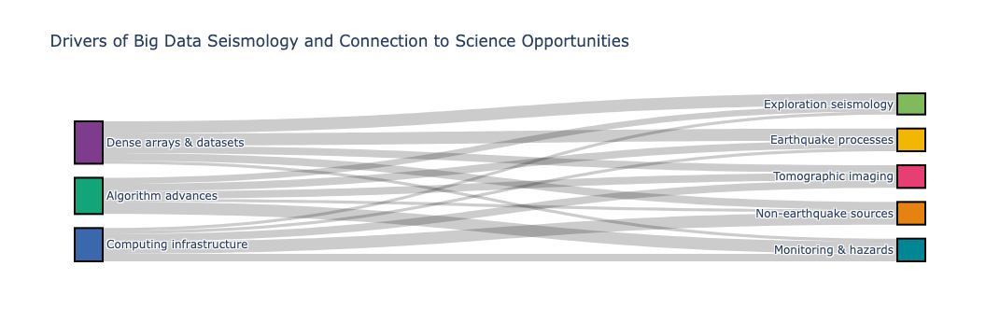

In [25]:
### Big Data Seismology


# define figure
fig = go.Figure(go.Sankey(
    arrangement = "fixed",
    
    # define nodes
    node = {
        
        # color
        #"color": px.colors.qualitative.Plotly, # default
        "color": px.colors.qualitative.Bold, # I like this better
        
        # label text
        "label": ["Dense arrays & datasets", "Algorithm advances", "Computing infrastructure", # 0,1,2
                  "Earthquake processes", "Tomographic imaging", "Exploration seismology", # 3, 4, 5
                  "Non-earthquake sources", "Monitoring & hazards"], #  6, 7
        
        # node formatting
        "thickness": 30, # width of rectangle
        'pad': 15,  # pad between rectangles
        'line' : dict(color = "black", width = 2.0), # line for boxes
        
    },    
    
    # define links between nodes
    link = {
        "source": [0,0,0,0,0, 1,1,1,1,1, 2,2,2,2,2], # source node index
        "target": [3,4,5,6,7, 3,4,5,6,7, 3,4,5,6,7], # target node index
        "value":  [4.01,2.5,4,2.5,1, 2.5,2.5,2,1,4, 1,2.5,1,4,2.5] # widths of connections
    }
))

# add a title
fig.update_layout(title_text="Drivers of Big Data Seismology and Connection to Science Opportunities",
                  font_size=12, # fontsize
                  width=700, # default is 1000 pixels
                  margin={"pad": 0.0}
                )

# show results
fig.show()

That example involved creating the Sankey plot by hand. You can also load information from a file. For example, check this one out!

See: https://plotly.com/python/sankey-diagram/ 

**Note:** Don't worry about the details of the code below, this is just to showcase the possibilities!!!

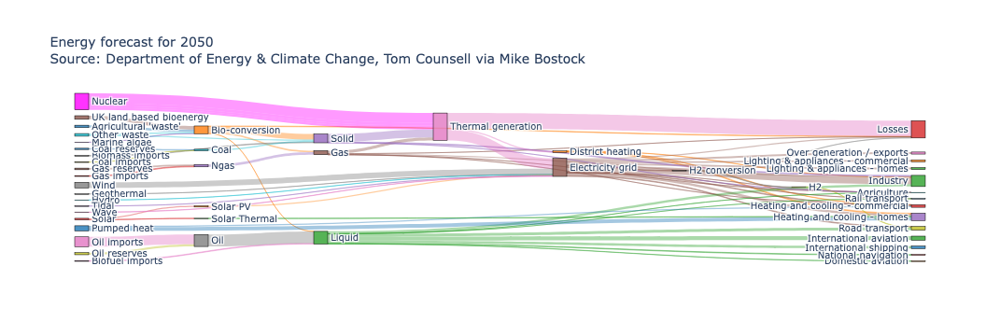

In [26]:
# download data from internet
import urllib, json
url = 'https://raw.githubusercontent.com/plotly/plotly.js/master/test/image/mocks/sankey_energy.json'
response = urllib.request.urlopen(url)
data = json.loads(response.read())

# override gray link colors with 'source' colors
opacity = 0.4

# change 'magenta' to its 'rgba' value to add opacity
data['data'][0]['node']['color'] = ['rgba(255,0,255, 0.8)' if color == "magenta" else color for color in data['data'][0]['node']['color']]
data['data'][0]['link']['color'] = [data['data'][0]['node']['color'][src].replace("0.8", str(opacity))
                                    for src in data['data'][0]['link']['source']]

# make figure
fig = go.Figure(data=[go.Sankey(
    valueformat = ".0f",
    valuesuffix = "TWh",
    
    # Define nodes
    node = dict(
      pad = 15,
      thickness = 15,
      line = dict(color = "black", width = 0.5),
      label =  data['data'][0]['node']['label'],
      color =  data['data'][0]['node']['color']
    ),
    
    # Add links
    link = dict(
      source =  data['data'][0]['link']['source'],
      target =  data['data'][0]['link']['target'],
      value =  data['data'][0]['link']['value'],
      label =  data['data'][0]['link']['label'],
      color =  data['data'][0]['link']['color']
))])

# update layout
fig.update_layout(title_text="Energy forecast for 2050<br>Source: Department of Energy & Climate Change, Tom Counsell via <a href='https://bost.ocks.org/mike/sankey/'>Mike Bostock</a>",
                  font_size=10)

# show
fig.show()

# Summary
* The `plotly` package can be used to make creative and interactive maps and movies
* Today's lecture focused on `scatter_mapbox` and `graph_objects`
* `scatter_mapbox` is great for colorful and/or animated maps
* `graph_objects` is great for visualizing data in 3D
* `Sankey` plots show flow-like relationships (river plots)